## This notebook plots a number of the metric sky maps for a series of opsim runs in single figures as subplots. 

All of the two year runs were WFD only and the requested number of visits was *not* decreased. The 10 year runs were also WFD only.

## There are 4 major sections of this notebook:

1. [10 year runs vs 2 year runs](#10-year-runs-vs-2-year-runs)
2. [Airmass opsim runs (Airmass bonus vaired, hour angle bonus 0)](#Airmass-opsim-runs)
3. [Hour Angle opsim runs (Airmass bonus 0, hour angle bonus varied)](#Hour-angle-opsim-runs)
4. [Opsim runs with both-bonuses varied](#Opsim-runs-with-both-bonuses-varied)

## Within each section you will find the following maps:

* Pointing history on Alt Az Sky, all filters
* NVisits on Ra Dec Sky, r band
* Median single visit depth, r band

## Summary

* The goal of producing these maps was to highlight the non-uniformity in sky coverage that occurs in the 2 year runs when the airmass bonus and hour angle bonus are increased. 

* The non-uniformity is espeically well illustrated in the NVisits sky maps when either bonus value is greater than 0.5.
    
* Comparing a 10 and 2 year run with the same bonus values shows that the non-uniform sky coverage is not present in 10 year.

In [1]:
import pandas as pd
from __future__ import print_function
import os
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
from lsst.sims.maf.db import OpsimDatabaseV4
import lsst.sims.maf.db as db
import lsst.sims.maf.metrics as metrics
import lsst.sims.maf.slicers as slicers
import lsst.sims.maf.metricBundles as metricBundles
import lsst.sims.maf.plots as plots
import lsst.sims.maf.utils as utils
from lsst.sims.maf.web import MafRunComparison

/home/docmaf/stack/python/miniconda3-4.2.12/lib/python3.5/site-packages/matplotlib/__init__.py:1405: UserWarning: 
This call to matplotlib.use() has no effect because the backend has already
been chosen; matplotlib.use() must be called *before* pylab, matplotlib.pyplot,
or matplotlib.backends is imported for the first time.

  warnings.warn(_use_error_msg)


In [2]:
def subplotSkyMaps(dataframe,outDirs,metricName,nrows,ncols,slicerAbrv='HEAL',
                   metadata=None,opsim=False,titleList=None,labelList=None,figsize=None,
                   colorbarRun=None):
    runNames = dataframe.index
    bundles = {}
    userPlotDict = {}
    userPlotDict['figsize'] = figsize
    if slicerAbrv == 'HEAL':
        p = plots.HealpixSkyMap()
    if ((slicerAbrv == 'HEAL') & ('Alt_Az' in metricName)):
        userPlotDict['rot'] = (0, 90, 0)
    if slicerAbrv == 'OPSI': 
        p = plots.BaseSkyMap()
    for i,run in enumerate(runNames):
        if metadata:
            metadatastr = '_'+metadata
        else:
            metadatastr = ''
        if opsim:
            metricFile = 'opsim'+'_'+metricName+metadatastr+'_'+slicerAbrv+'.npz'
        else:
            metricFile = run+'_'+metricName+metadatastr+'_'+slicerAbrv+'.npz'
        bundles[run] = metricBundles.createEmptyMetricBundle()
        bundles[run].read(run+outDirs[i]+metricFile)
    fig = plt.figure(1, figsize=userPlotDict['figsize'])
    if colorbarRun:
        userPlotDict['colorMin'] = bundles[run].metricValues.compressed().min()
        userPlotDict['colorMax'] = bundles[run].metricValues.compressed().max()
    for k,runPlot in enumerate(runNames):
        userPlotDict['sub'] = (nrows,ncols,k+1)
        if metadata:
            userPlotDict['xlabel'] = bundles[runPlot].metric.name+' ('+metadata+')'
        else:
            userPlotDict['xlabel'] = bundles[runPlot].metric.name
        if titleList:
            userPlotDict['title'] = titleList[k]
        else:
            userPlotDict['title'] = "%s %.2f %.2f" % (runPlot,dataframe.loc[runPlot]['airmass_bonus'],
                                                      dataframe.loc[runPlot]['hour_angle_bonus'])
        
        p(bundles[runPlot].metricValues, slicer=bundles[runPlot].slicer, userPlotDict=userPlotDict,fignum=1)
        
    plt.suptitle(bundles[runPlot].displayDict['caption'])
    fig.subplots_adjust(hspace=0.2)


In [3]:
runs10 = pd.read_csv('colossus_10.csv')
runnames10 = []
for r in runs10['Colossus run']:
    runnames10.append('colossus_' + str(r))

In [4]:
comp10 = MafRunComparison(baseDir='.', runlist=runnames10)

In [5]:
stats_10_df,metricDict10 = comp10.combineSummaryStats('WideFastDeep',['airmass_bonus','hour_angle_bonus'])


Querying Config parameters with the following query:
paramName like "%WideFastDeep%airmass_bonus%" or paramName like "%WideFastDeep%hour_angle_bonus%"


# 10 year runs vs 2 year runs

## Pointing history on Alt Az Sky, all filters

## 10 year runs on the left, 2 year runs on the right

Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes
Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes
Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes
Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes
Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes
Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes
Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes
Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes


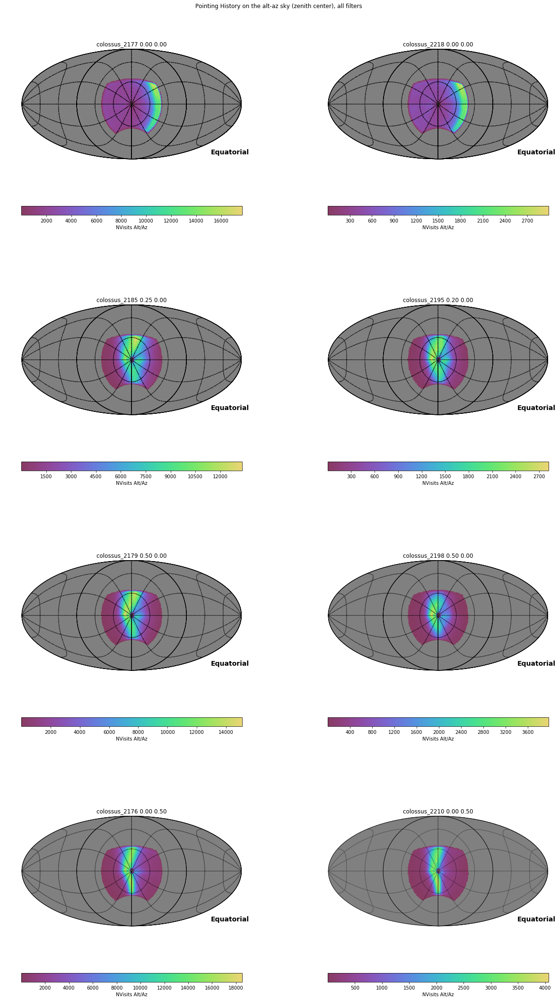

In [6]:
subplotSkyMaps(stats_10_df,['/sched/']*len(stats_10_df.index),'NVisits_Alt_Az',nrows=4,ncols=2,
               metadata=None,slicerAbrv='HEAL',opsim=False,figsize=(18,30))

## NVisits on Ra Dec Sky, r band

/home/docmaf/userRepos/sims_maf/python/lsst/sims/maf/plots/spatialPlotters.py:545: MatplotlibDeprecationWarning: The set_axis_bgcolor function was deprecated in version 2.0. Use set_facecolor instead.
  ax.set_axis_bgcolor(plotDict['bgcolor'])


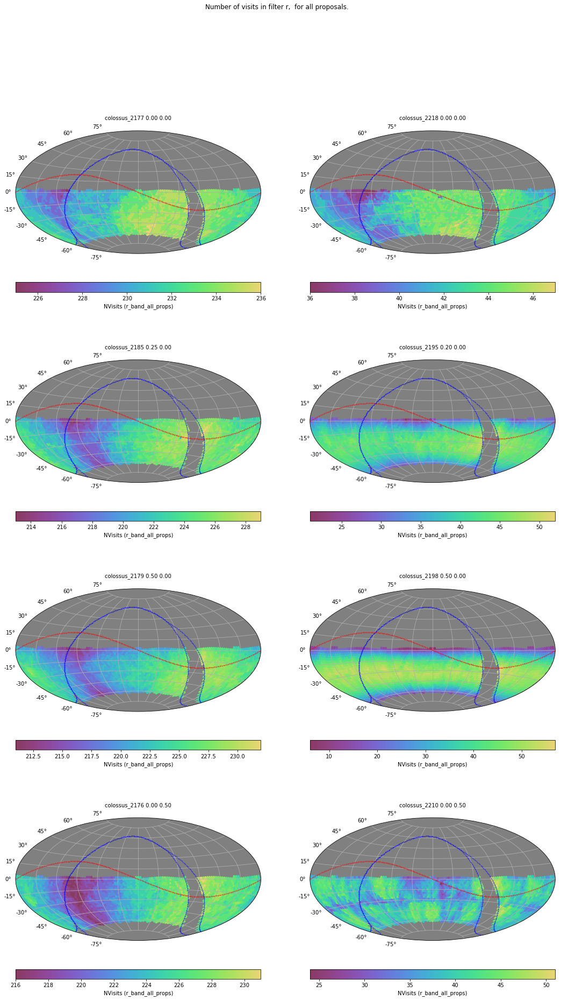

In [7]:
subplotSkyMaps(stats_10_df,['/sched/']*len(stats_10_df.index),'NVisits',nrows=4,ncols=2,
               metadata='r_band_all_props',slicerAbrv='OPSI',opsim=False,figsize=(18,30))

## Median single visit depth, r band

/home/docmaf/userRepos/sims_maf/python/lsst/sims/maf/plots/spatialPlotters.py:545: MatplotlibDeprecationWarning: The set_axis_bgcolor function was deprecated in version 2.0. Use set_facecolor instead.
  ax.set_axis_bgcolor(plotDict['bgcolor'])


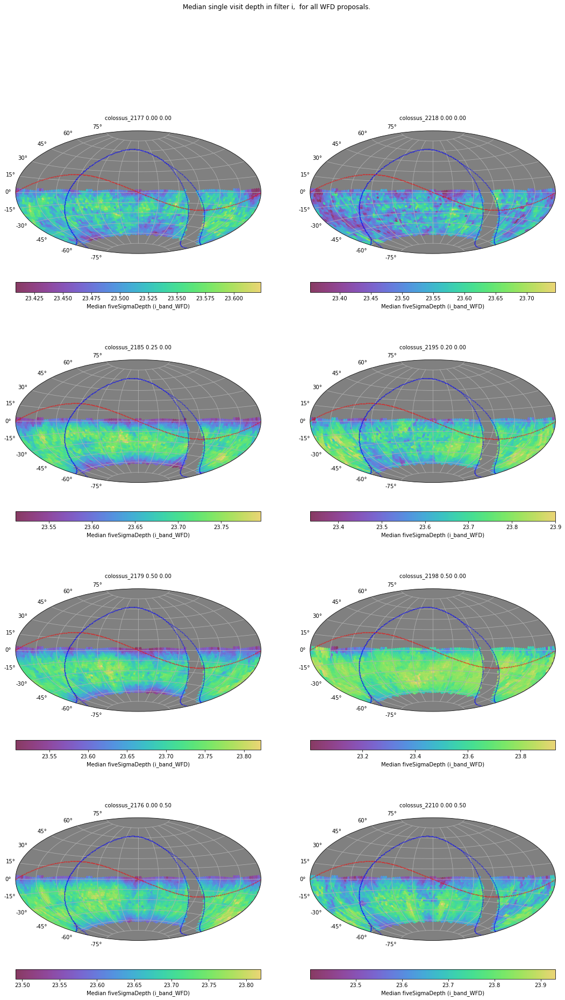

In [8]:
subplotSkyMaps(stats_10_df,['/sched/']*len(stats_10_df.index),'Median_fiveSigmaDepth',nrows=4,ncols=2,
               metadata='i_band_WFD',slicerAbrv='OPSI',opsim=False,figsize=(18,30))

In [9]:
runs_df = pd.read_csv('colossus_runs.csv')

In [10]:
# Create list of runnames from the run_df dataframe
runnames = []
for r in runs_df['Colossus run']:
    runnames.append('colossus_' + str(r))

In [11]:
comp = MafRunComparison(baseDir='.', runlist=runnames)
stats_df,metricDict = comp.combineSummaryStats('WideFastDeep',['airmass_bonus','hour_angle_bonus'])

Querying Config parameters with the following query:
paramName like "%WideFastDeep%airmass_bonus%" or paramName like "%WideFastDeep%hour_angle_bonus%"


In [12]:
airmass_df = stats_df[(stats_df.airmass_bonus >= 0) & (stats_df.hour_angle_bonus == 0.0 )]
hourangle_df = stats_df[(stats_df.airmass_bonus == 0) & (stats_df.hour_angle_bonus >= 0.0 )]

# Airmass opsim runs

## Pointing history on Alt Az Sky, all filters

### Airmass bonus values increase left to right, top to bottom. The bottom right corner is airmass bonus =1.0. The limits of the all of the color bars were set to the same values taken from colossus_2203.

Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes
Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes
Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes
Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes
Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes
Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes
Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes
Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes
Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes
Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes
Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes
Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes


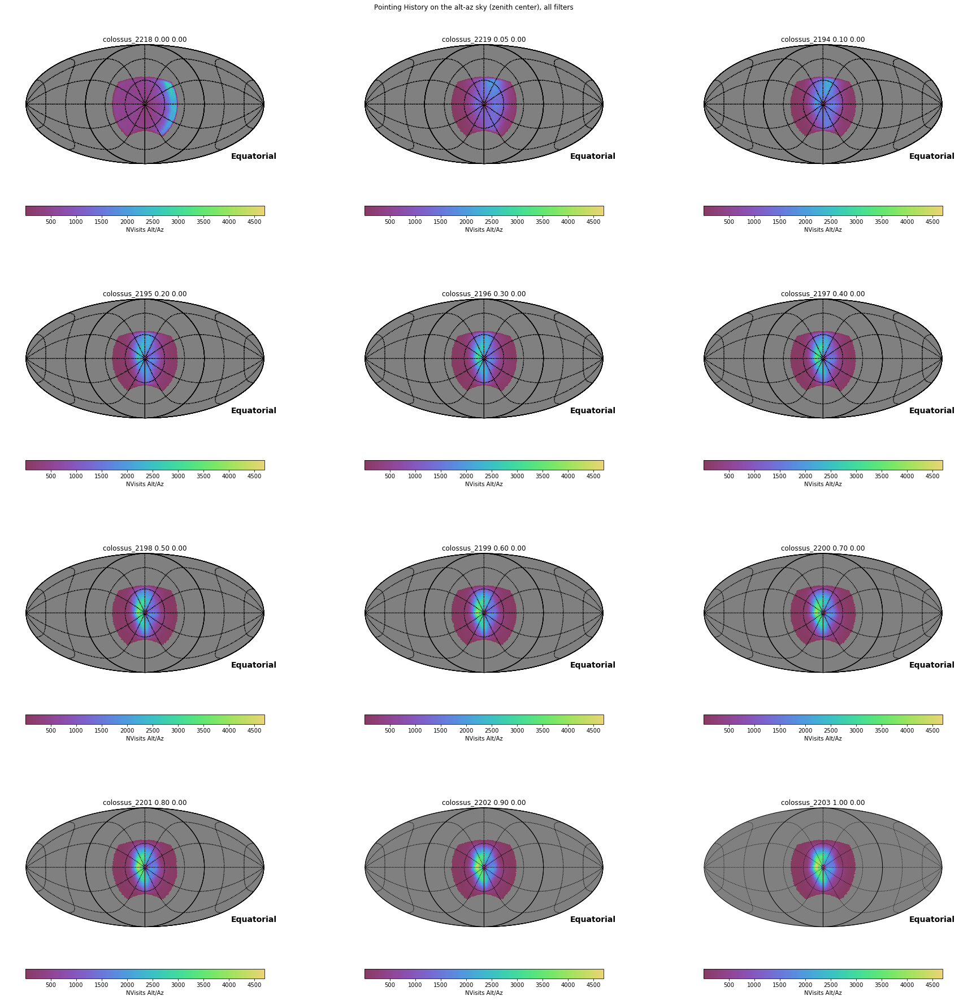

In [13]:
subplotSkyMaps(airmass_df,['/sched/']*len(airmass_df.index),'NVisits_Alt_Az',nrows=4,ncols=3,
               metadata=None,slicerAbrv='HEAL',opsim=False,figsize=(25,25),colorbarRun='colossus_2203')
plt.savefig('airmass_bonus_altaz.pdf')

## NVisits on Ra Dec Sky, r band

### Airmass bonus values increase left to right, top to bottom. The bottom right corner is airmass bonus =1.0. The limits of the all of the color bars were set to the same values taken from colossus_2203.


/home/docmaf/userRepos/sims_maf/python/lsst/sims/maf/plots/spatialPlotters.py:545: MatplotlibDeprecationWarning: The set_axis_bgcolor function was deprecated in version 2.0. Use set_facecolor instead.
  ax.set_axis_bgcolor(plotDict['bgcolor'])


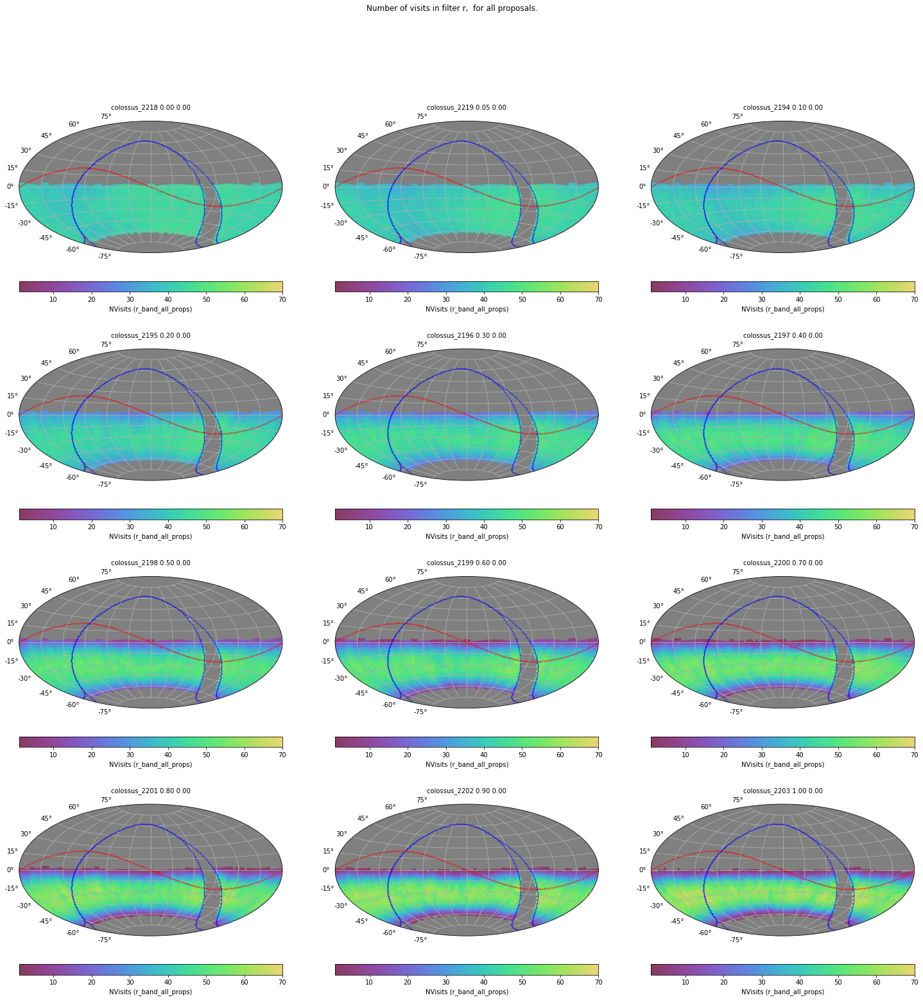

In [14]:
subplotSkyMaps(airmass_df,['/sched/']*len(airmass_df.index),'NVisits',nrows=4,ncols=3,
               metadata='r_band_all_props',slicerAbrv='OPSI',opsim=False,figsize=(25,25),
               colorbarRun='colossus_2203')
plt.savefig('airmass_bonus_Nvisits_rband.pdf')

## Median single visit depth, r band

### Airmass bonus values increase left to right, top to bottom. The bottom right corner is airmass bonus =1.0. The limits of the all of the color bars were set to the same values taken from colossus_2203.


/home/docmaf/userRepos/sims_maf/python/lsst/sims/maf/plots/spatialPlotters.py:545: MatplotlibDeprecationWarning: The set_axis_bgcolor function was deprecated in version 2.0. Use set_facecolor instead.
  ax.set_axis_bgcolor(plotDict['bgcolor'])


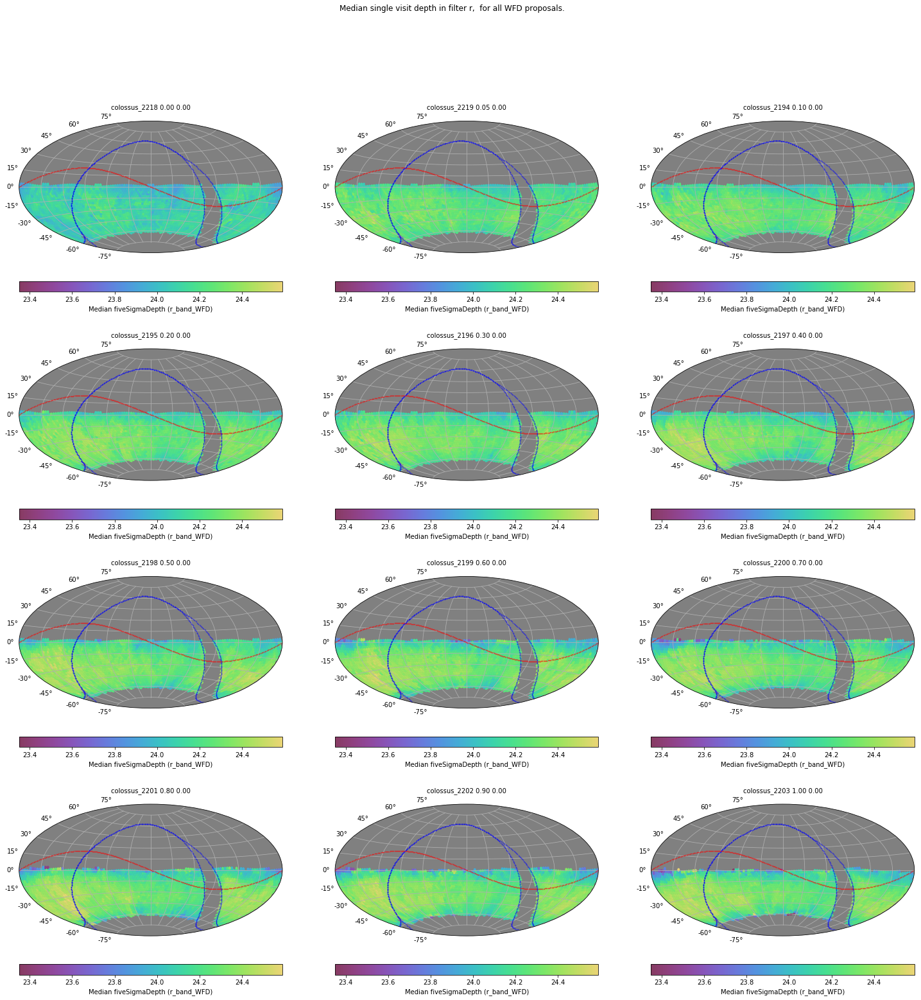

In [15]:
subplotSkyMaps(airmass_df,['/sched/']*len(airmass_df.index),'Median_fiveSigmaDepth',nrows=4,ncols=3,
               metadata='r_band_WFD',slicerAbrv='OPSI',opsim=False,figsize=(25,25),colorbarRun='colossus_2203')
plt.savefig('airmass_bonus_depth_rband.pdf')

# Hour angle opsim runs

## Pointing history on Alt Az Sky, all filters

### Hour angle bonus values increase left to right, top to bottom. The bottom right corner is hour angle bonus =1.0. The limits of the all of the color bars were set to the same values taken from colossus_2215.

Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes
Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes
Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes
Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes
Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes
Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes
Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes
Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes
Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes
Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes
Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes
Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes


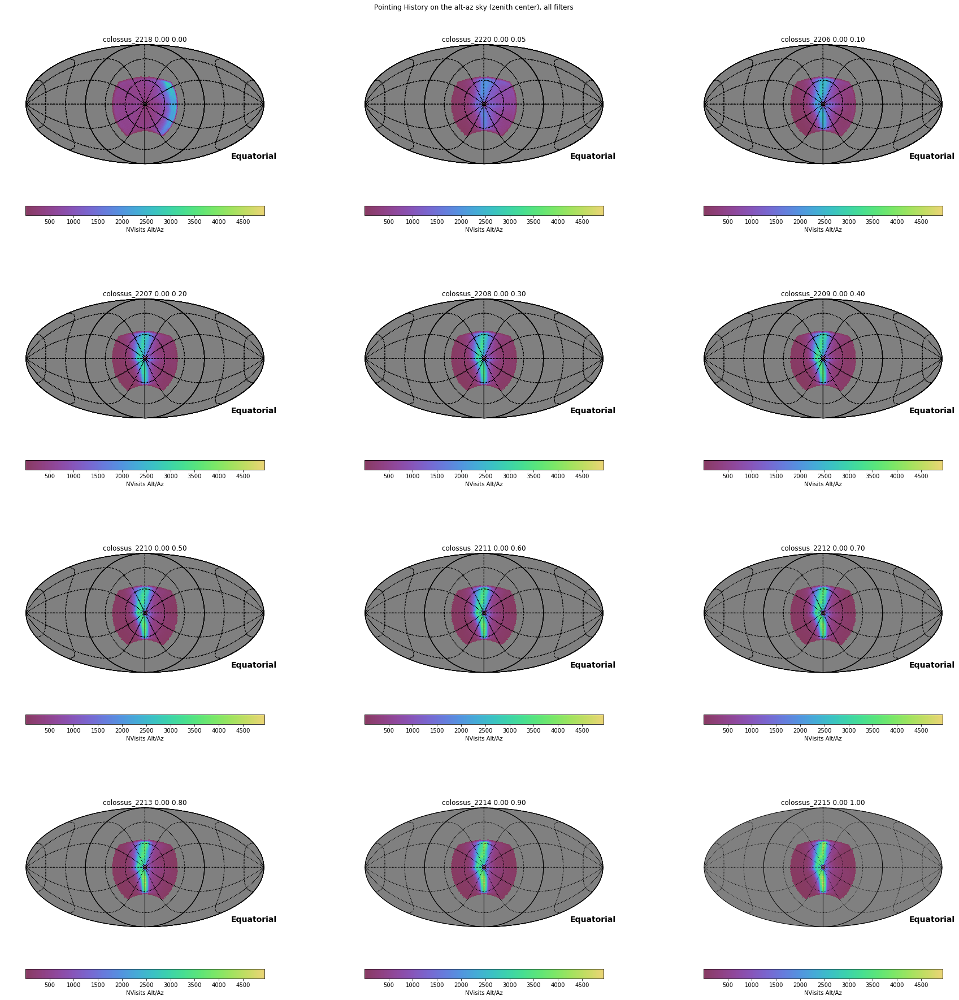

In [16]:
subplotSkyMaps(hourangle_df,['/sched/']*len(hourangle_df.index),'NVisits_Alt_Az',nrows=4,ncols=3,
               metadata=None,slicerAbrv='HEAL',opsim=False,figsize=(25,25),colorbarRun='colossus_2203')
plt.savefig('hourangle_bonus_altaz.pdf')

## NVisits on Ra Dec Sky, r band

### Hour angle bonus values increase left to right, top to bottom. The bottom right corner is hour angle bonus = 1.0. The limits of the all of the color bars were set to the same values taken from colossus_2215.

/home/docmaf/userRepos/sims_maf/python/lsst/sims/maf/plots/spatialPlotters.py:545: MatplotlibDeprecationWarning: The set_axis_bgcolor function was deprecated in version 2.0. Use set_facecolor instead.
  ax.set_axis_bgcolor(plotDict['bgcolor'])


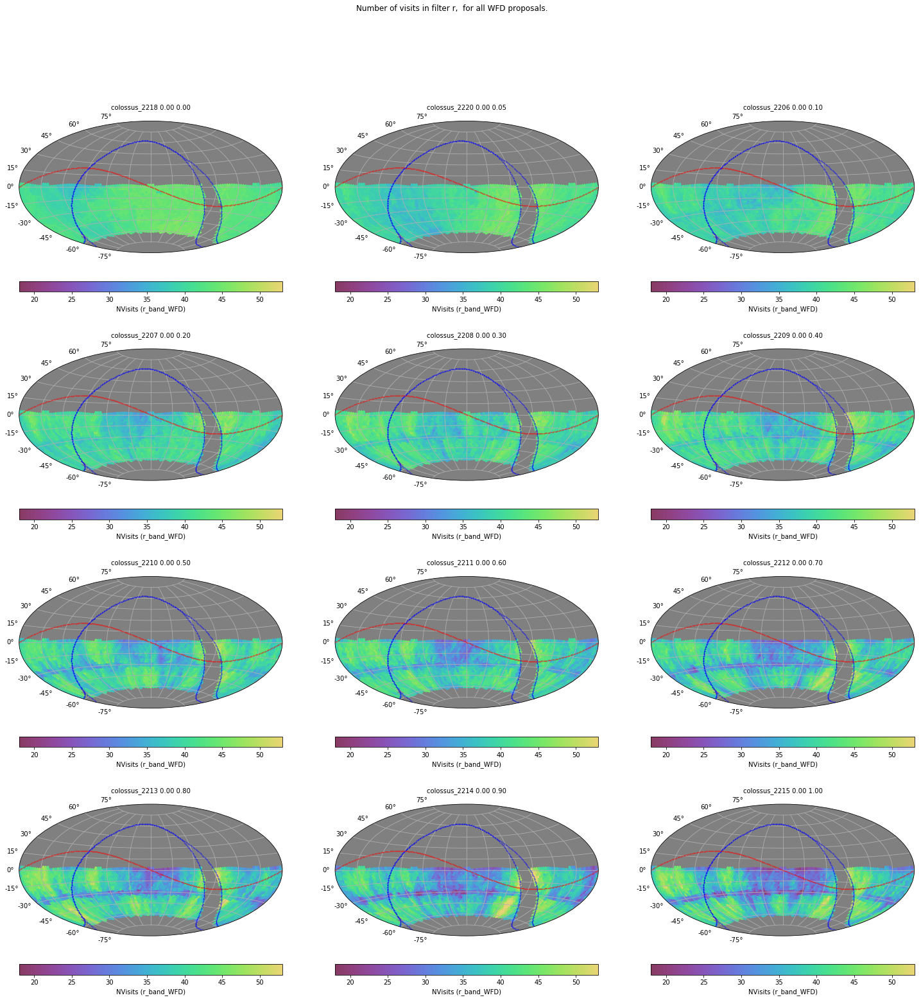

In [17]:
subplotSkyMaps(hourangle_df,['/sched/']*len(hourangle_df.index),'NVisits',nrows=4,ncols=3,
               metadata='r_band_WFD',slicerAbrv='OPSI',opsim=False,figsize=(25,25),colorbarRun='colossus_2215')
plt.savefig('hourangle_bonus_Nvisits_rband.pdf')

## Median single visit depth, r band

### Hour angle bonus values increase left to right, top to bottom. The bottom right corner is hour angle bonus = 1.0. The limits of the all of the color bars were set to the same values taken from colossus_2215.

/home/docmaf/userRepos/sims_maf/python/lsst/sims/maf/plots/spatialPlotters.py:545: MatplotlibDeprecationWarning: The set_axis_bgcolor function was deprecated in version 2.0. Use set_facecolor instead.
  ax.set_axis_bgcolor(plotDict['bgcolor'])


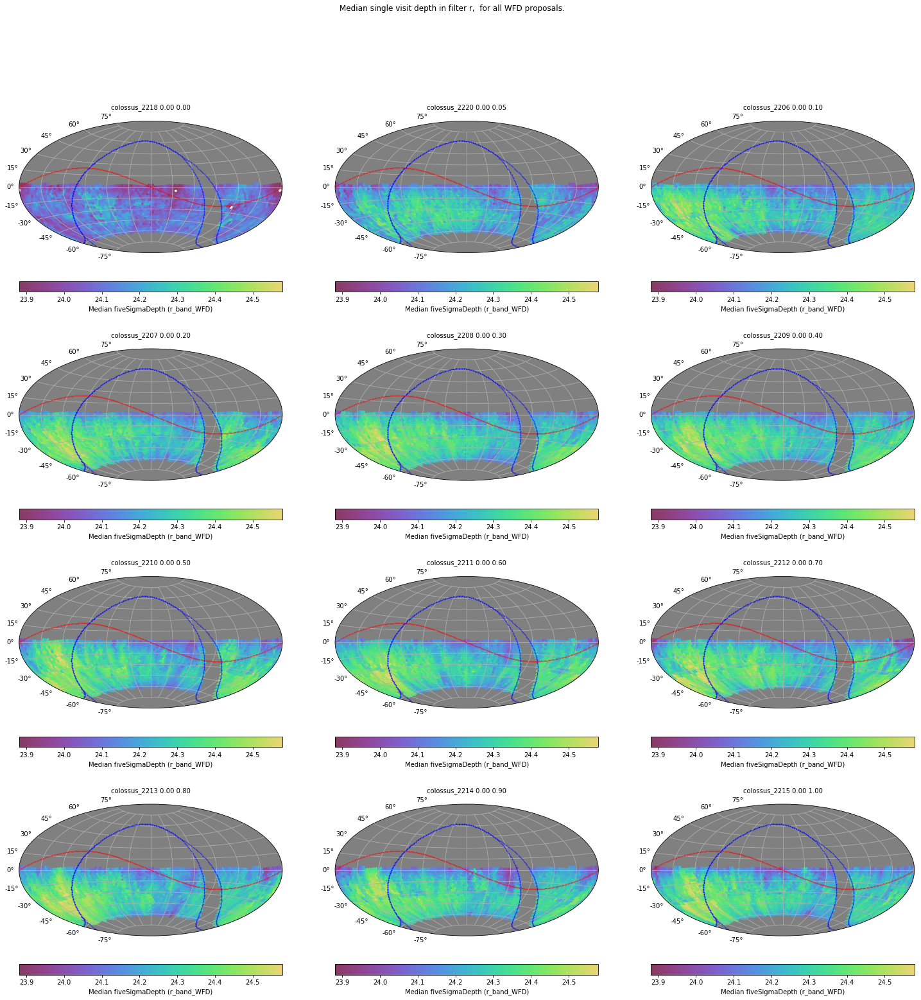

In [18]:
subplotSkyMaps(hourangle_df,['/sched/']*len(hourangle_df.index),'Median_fiveSigmaDepth',nrows=4,ncols=3,
               metadata='r_band_WFD',slicerAbrv='OPSI',opsim=False,figsize=(25,25),colorbarRun='colossus_2215')
plt.savefig('hourangle_bonus_depth_rband.pdf')

# Opsim runs with both bonuses varied

In [19]:
combo_df = stats_df.loc[['colossus_2216','colossus_2217']]

## Pointing history on Alt Az Sky, all filters

Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes
Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes


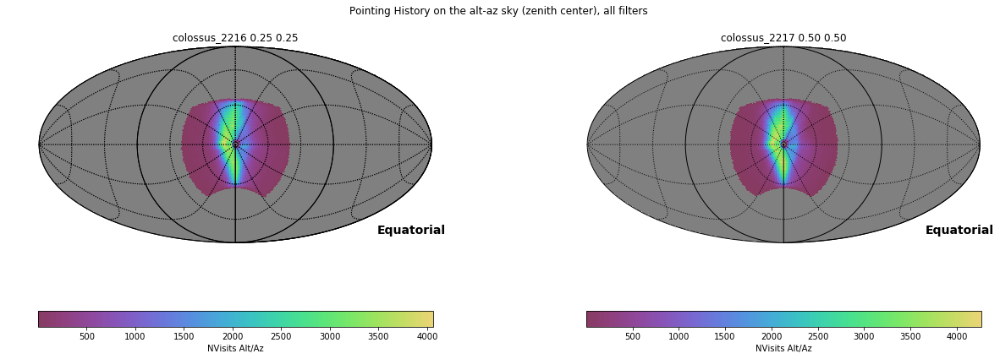

In [20]:
subplotSkyMaps(combo_df,['/sched/']*len(combo_df.index),'NVisits_Alt_Az',nrows=1,ncols=2,
               metadata=None,slicerAbrv='HEAL',opsim=False,figsize=(18,6))

## NVisits on Ra Dec Sky, r band

/home/docmaf/userRepos/sims_maf/python/lsst/sims/maf/plots/spatialPlotters.py:545: MatplotlibDeprecationWarning: The set_axis_bgcolor function was deprecated in version 2.0. Use set_facecolor instead.
  ax.set_axis_bgcolor(plotDict['bgcolor'])


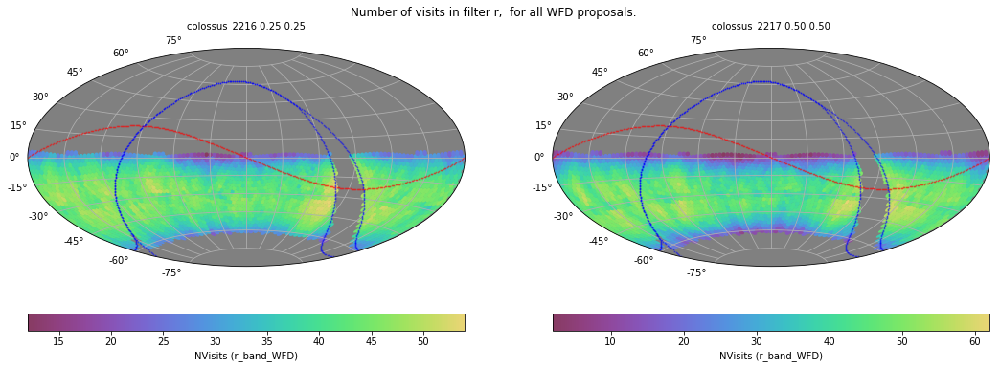

In [21]:
subplotSkyMaps(combo_df,['/sched/']*len(combo_df.index),'NVisits',nrows=1,ncols=2,
               metadata='r_band_WFD',slicerAbrv='OPSI',
               opsim=False,figsize=(18,6))

## Median single visit depth, r band

/home/docmaf/userRepos/sims_maf/python/lsst/sims/maf/plots/spatialPlotters.py:545: MatplotlibDeprecationWarning: The set_axis_bgcolor function was deprecated in version 2.0. Use set_facecolor instead.
  ax.set_axis_bgcolor(plotDict['bgcolor'])


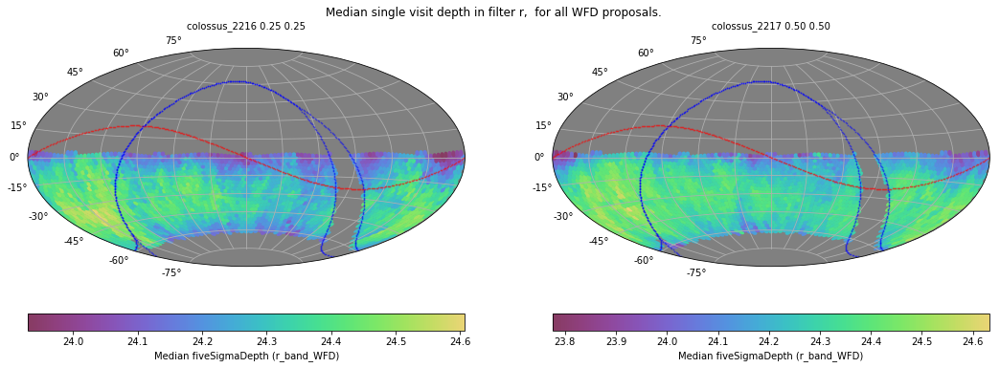

In [22]:
subplotSkyMaps(combo_df,['/sched/']*len(combo_df.index),'Median_fiveSigmaDepth',nrows=1,ncols=2,
               metadata='r_band_WFD',slicerAbrv='OPSI',opsim=False,figsize=(18,6))